# Uber New York Trips Data Analysis Project

### Importing the libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

### Importing the dataset

In [2]:
import os
files=os.listdir(r'D:\Pandas Data Analysis Project\Uber New York Trip Project\uber-pickups-in-new-york-city')[-7:]

In [3]:
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [4]:
files.remove('uber-raw-data-janjune-15.csv')

In [5]:
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [6]:
path = r'D:\Pandas Data Analysis Project\Uber New York Trip Project\uber-pickups-in-new-york-city'

final_df = pd.DataFrame()

for file in files:
    raw_df = pd.read_csv(path+'/'+file, encoding='utf-8')
    final_df = pd.concat([raw_df, final_df])
    

### Copying `final_df` into a new DataFrame for analysis

In [7]:
uber_df=final_df.copy()

### Getting Basic Information about the Dataset

In [8]:
uber_df.shape

(4534327, 4)

In [9]:
uber_df.head()

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512


In [10]:
uber_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4534327 entries, 0 to 564515
Data columns (total 4 columns):
 #   Column     Dtype  
---  ------     -----  
 0   Date/Time  object 
 1   Lat        float64
 2   Lon        float64
 3   Base       object 
dtypes: float64(2), object(2)
memory usage: 173.0+ MB


In [11]:
uber_df.describe()

,Lat,Lon
count,4.534327e+06,4.534327e+06
mean,4.073926e+01,-7.397302e+01
std,3.994991e-02,5.726670e-02
min,3.965690e+01,-7.492900e+01
25%,4.072110e+01,-7.399650e+01
50%,4.074220e+01,-7.398340e+01
75%,4.076100e+01,-7.396530e+01
max,4.211660e+01,-7.206660e+01


### Coverting `Date/Time` column into DateTime type

In [12]:
uber_df['Date/Time'] = pd.to_datetime(uber_df['Date/Time'], format='%m/%d/%Y %H:%M:%S')

In [13]:
uber_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4534327 entries, 0 to 564515
Data columns (total 4 columns):
 #   Column     Dtype         
---  ------     -----         
 0   Date/Time  datetime64[ns]
 1   Lat        float64       
 2   Lon        float64       
 3   Base       object        
dtypes: datetime64[ns](1), float64(2), object(1)
memory usage: 173.0+ MB


In [14]:
uber_df.head()

,Date/Time,Lat,Lon,Base
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512


### Creating `Month`, `Weekday`, `Day`, `Hour` and `Minute` Columns

In [15]:
uber_df['Month'] = uber_df['Date/Time'].dt.month
uber_df['Month Name'] = uber_df['Date/Time'].dt.month_name(locale = 'English')
uber_df['Weekday'] = uber_df['Date/Time'].dt.day_name()
uber_df['Day'] = uber_df['Date/Time'].dt.day
uber_df['Hour'] = uber_df['Date/Time'].dt.hour
uber_df['Minute'] = uber_df['Date/Time'].dt.minute

In [16]:
uber_df.head()

,Date/Time,Lat,Lon,Base,Month,Month Name,Weekday,Day,Hour,Minute
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,9,September,Monday,1,0,1
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,9,September,Monday,1,0,1
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,9,September,Monday,1,0,3
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,9,September,Monday,1,0,6
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,9,September,Monday,1,0,11


In [17]:
uber_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4534327 entries, 0 to 564515
Data columns (total 10 columns):
 #   Column      Dtype         
---  ------      -----         
 0   Date/Time   datetime64[ns]
 1   Lat         float64       
 2   Lon         float64       
 3   Base        object        
 4   Month       int64         
 5   Month Name  object        
 6   Weekday     object        
 7   Day         int64         
 8   Hour        int64         
 9   Minute      int64         
dtypes: datetime64[ns](1), float64(2), int64(4), object(3)
memory usage: 380.5+ MB


### Checking for Null records in the dataset

In [18]:
uber_df.isnull().sum()

Date/Time     0
Lat           0
Lon           0
Base          0
Month         0
Month Name    0
Weekday       0
Day           0
Hour          0
Minute        0
dtype: int64

### Sorting the dataset by `Date` Column

In [19]:
uber_df.sort_values(by='Date/Time', inplace=True)

### Q1. Analysis of Journey by `Weekdays`

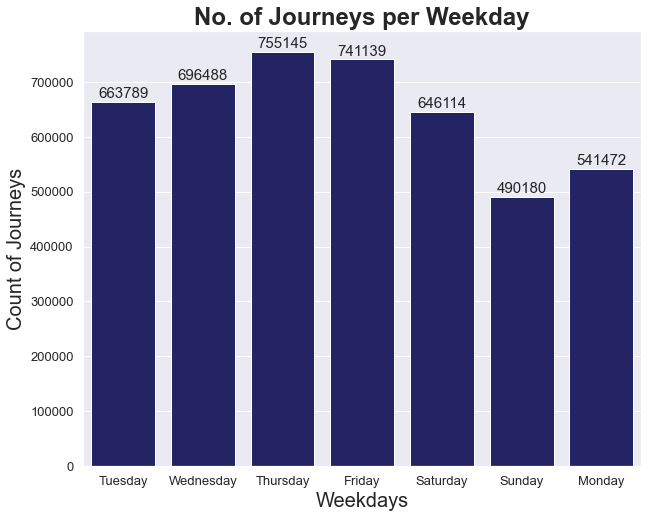

In [20]:
plt.figure(figsize=(10,8))

plots=sns.countplot(x=uber_df['Weekday'], color='midnightblue')

for bar in plots.patches:
        plots.annotate(format(bar.get_height()), 
                   (bar.get_x() + bar.get_width() / 2, 
                    bar.get_height()), ha='center', va='center',
                   size=15, xytext=(0, 8),
                   textcoords='offset points')
        
plt.xlabel('Weekdays', fontsize = 20)
plt.xticks(fontsize=13)
plt.ylabel('Count of Journeys', fontsize = 20)
plt.yticks(fontsize=13)
plt.title('No. of Journeys per Weekday', fontsize = 24, fontweight = 'bold')

plt.show()

### Q2. Analysis of Journey by `Hours` for each `Month`

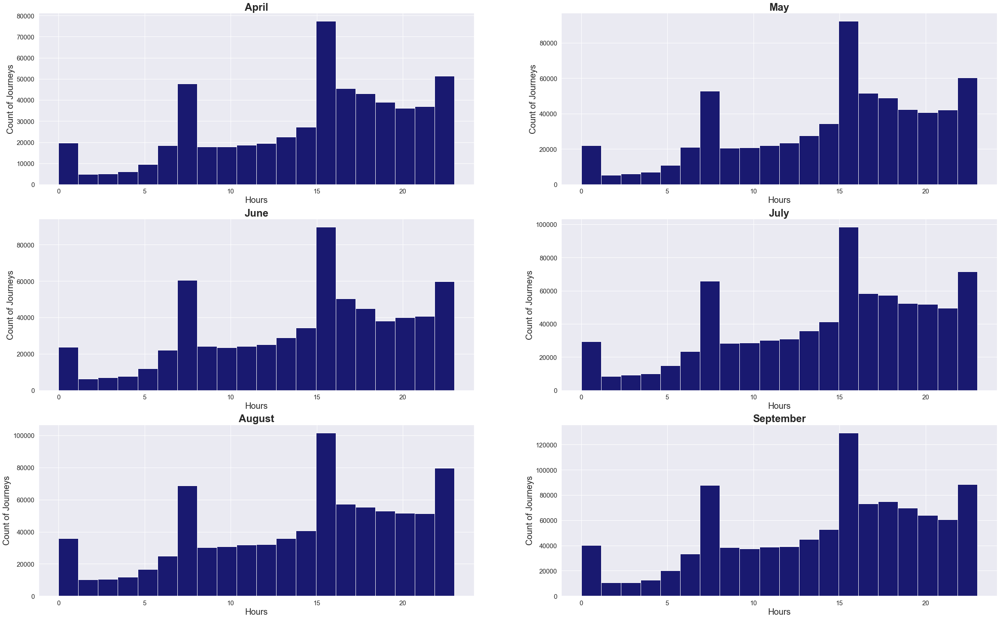

In [21]:
plt.figure(figsize=(40,25))

for index,month in enumerate(uber_df['Month Name'].unique()):
    plt.subplot(3,2,index+1)
    uber_df[uber_df['Month Name'] == month]['Hour'].hist(bins=20, color='midnightblue')
    plt.xlabel('Hours', fontsize = 20)
    plt.xticks(fontsize=15)
    plt.ylabel('Count of Journeys', fontsize = 20)
    plt.yticks(fontsize=15)
    plt.title(month, fontsize = 24, fontweight = 'bold')

plt.show()

### Q3. Analysis of Journey by `Months`

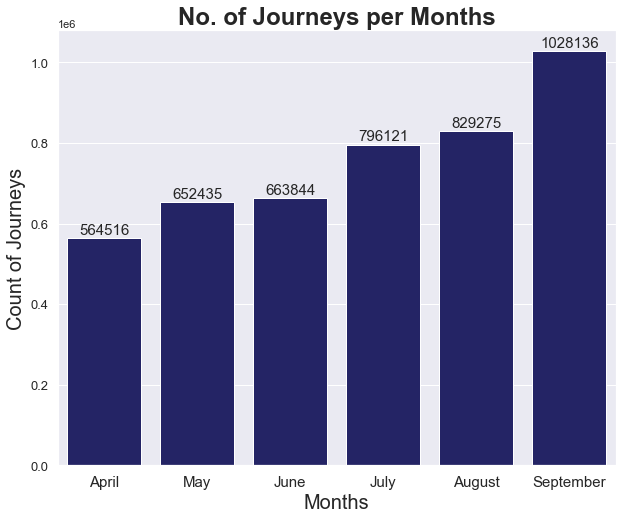

In [22]:
plt.figure(figsize=(10,8))

plots=sns.countplot(x=uber_df['Month Name'], color='midnightblue')

for bar in plots.patches:
        plots.annotate(format(bar.get_height()), 
                   (bar.get_x() + bar.get_width() / 2, 
                    bar.get_height()), ha='center', va='center',
                   size=15, xytext=(0, 8),
                   textcoords='offset points')
        
plt.xlabel('Months', fontsize = 20)
plt.xticks(fontsize=15)
plt.ylabel('Count of Journeys', fontsize = 20)
plt.yticks(fontsize=13)
plt.title('No. of Journeys per Months', fontsize = 24, fontweight = 'bold')

plt.show()

### Q4. Analysis of Journey by `Day` of Months

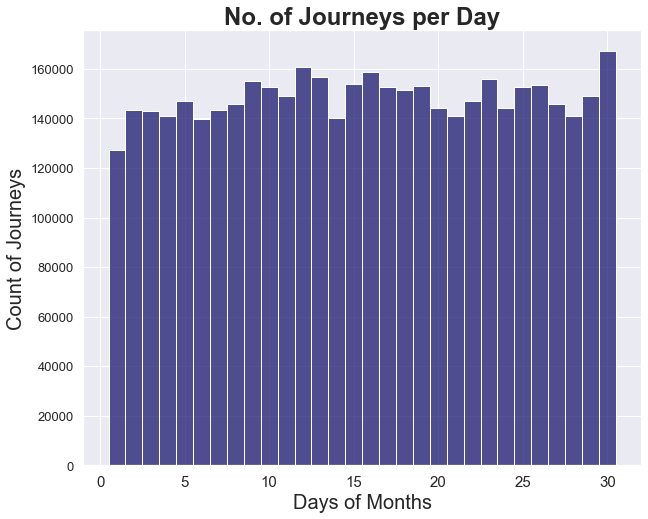

In [23]:
plt.figure(figsize=(10,8))

plots=sns.histplot(x=uber_df['Day'], color='midnightblue', bins=30, binwidth=1, binrange=(0.5,30.5))

plt.xlabel('Days of Months', fontsize = 20)
plt.xticks(fontsize=15)
plt.ylabel('Count of Journeys', fontsize = 20)
plt.yticks(fontsize=13)
plt.title('No. of Journeys per Day', fontsize = 24, fontweight = 'bold')

plt.show()

### Q5. Analysis of Journey by `Day` of Months for each `Month`

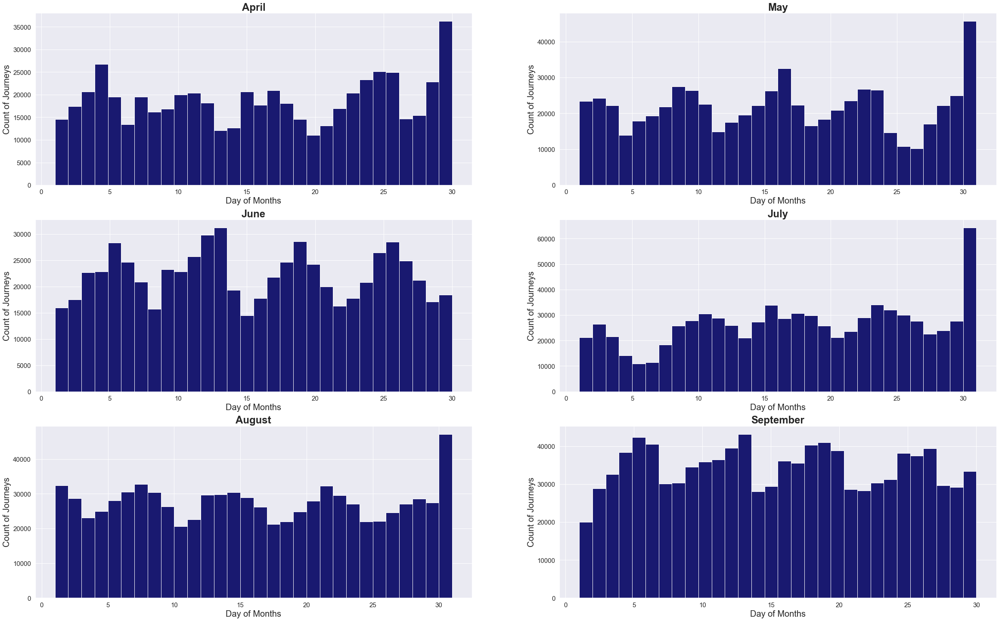

In [24]:
plt.figure(figsize=(40,25))

for index,month in enumerate(uber_df['Month Name'].unique()):
    plt.subplot(3,2,index+1)
    uber_df[uber_df['Month Name'] == month]['Day'].hist(bins=30, color='midnightblue')
    plt.xlabel('Day of Months', fontsize = 20)
    plt.xticks(fontsize=15)
    plt.ylabel('Count of Journeys', fontsize = 20)
    plt.yticks(fontsize=15)
    plt.title(month, fontsize = 24, fontweight = 'bold')

plt.show()

### Q6. Rush Hour Analysis per `Latitude` for each `Weekday`

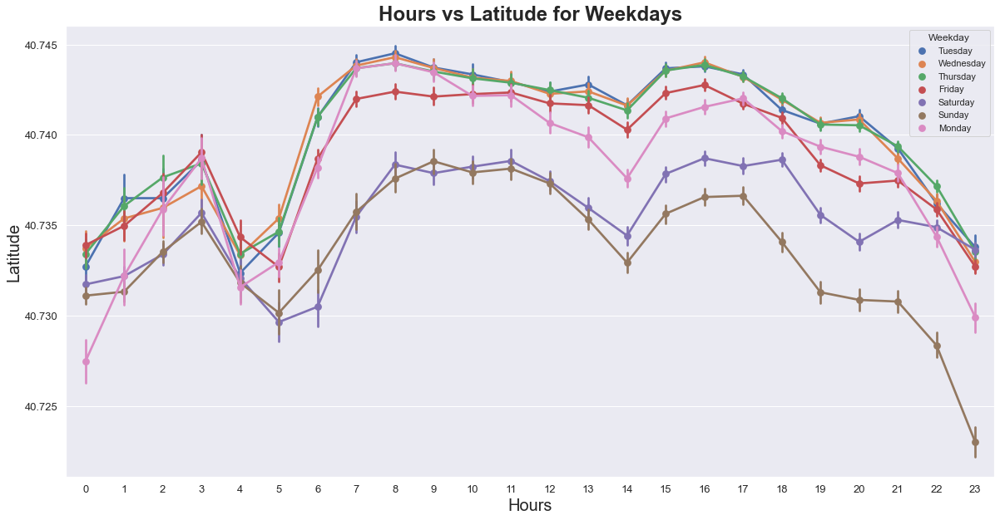

In [25]:
plt.figure(figsize=(20,10))

sns.pointplot(x=uber_df['Hour'], y=uber_df['Lat'], hue=uber_df['Weekday'])
       
plt.xlabel('Hours', fontsize = 20)
plt.xticks(fontsize=13)
plt.ylabel('Latitude', fontsize = 20)
plt.yticks(fontsize=13)
plt.title('Hours vs Latitude for Weekdays', fontsize = 24, fontweight = 'bold')

plt.show()

### Q7. Which Base Number gets popular for each month 

In [26]:
base_df=uber_df.groupby(['Base', 'Month', 'Month Name'])['Date/Time'].count().reset_index()
base_df

,Base,Month,Month Name,Date/Time
0,B02512,4,April,35536
1,B02512,5,May,36765
2,B02512,6,June,32509
3,B02512,7,July,35021
4,B02512,8,August,31472
5,B02512,9,September,34370
6,B02598,4,April,183263
7,B02598,5,May,260549
8,B02598,6,June,242975
9,B02598,7,July,245597


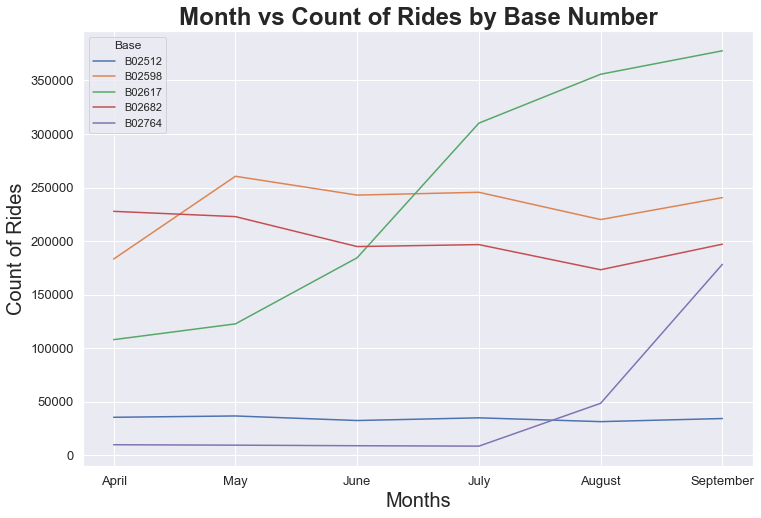

In [27]:
plt.figure(figsize=(12,8))

sns.lineplot(x=base_df['Month Name'], y=base_df['Date/Time'], hue=base_df['Base'])
       
plt.xlabel('Months', fontsize = 20)
plt.xticks(fontsize=13)
plt.ylabel('Count of Rides', fontsize = 20)
plt.yticks(fontsize=13)
plt.title('Month vs Count of Rides by Base Number', fontsize = 24, fontweight = 'bold')

plt.show()

### Q8. Show Heatmap for various parameters

In [28]:
def map_heatmap(col1, col2):
    plt.figure(figsize=(20,10))
    return sns.heatmap(uber_df.groupby([col1, col2])['Date/Time'].count().unstack(), cmap="Blues")
    

### Heatmap between `Weekday` and `Hour` Columns

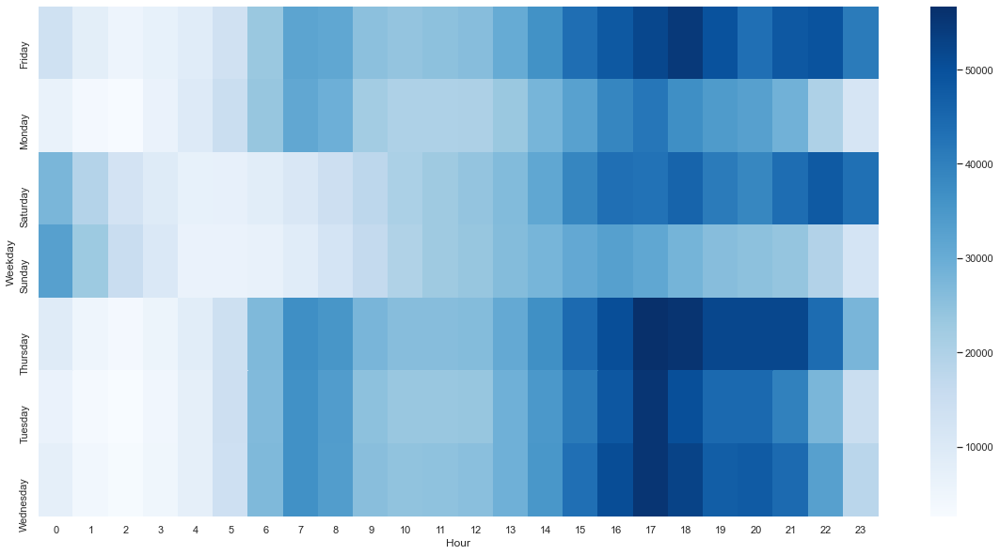

In [29]:
map_heatmap('Weekday', 'Hour')
plt.show()

### Heatmap between `Day` and `Hour` Columns

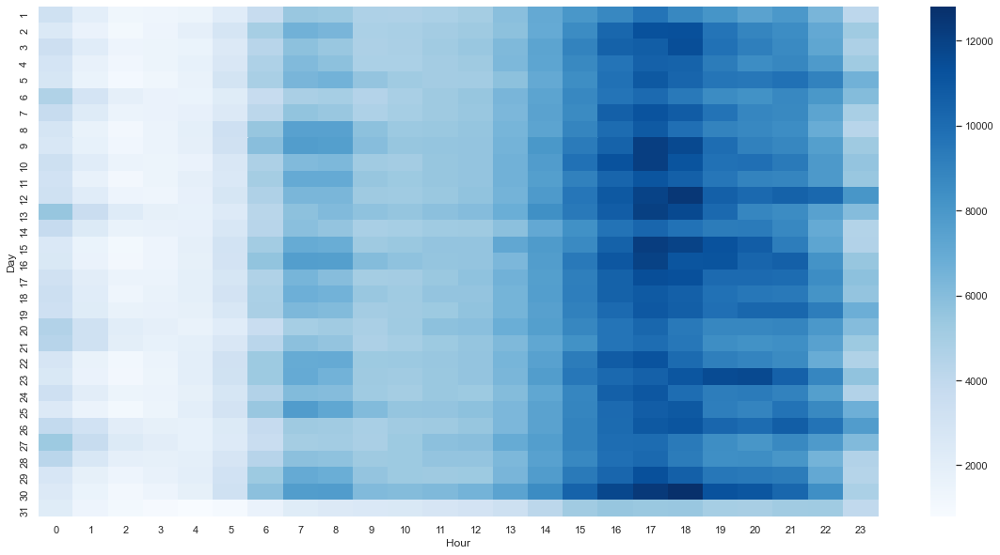

In [30]:
map_heatmap('Day', 'Hour')
plt.show()

### Heatmap between `Month` and `Day` Columns

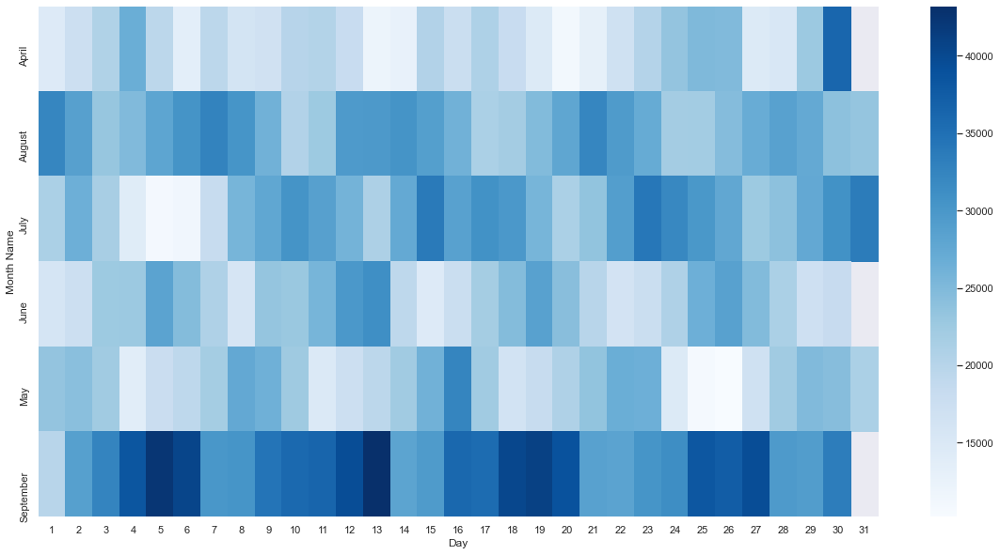

In [31]:
map_heatmap('Month Name', 'Day')
plt.show()

### Heatmap between `Month` and `Weekday` Columns

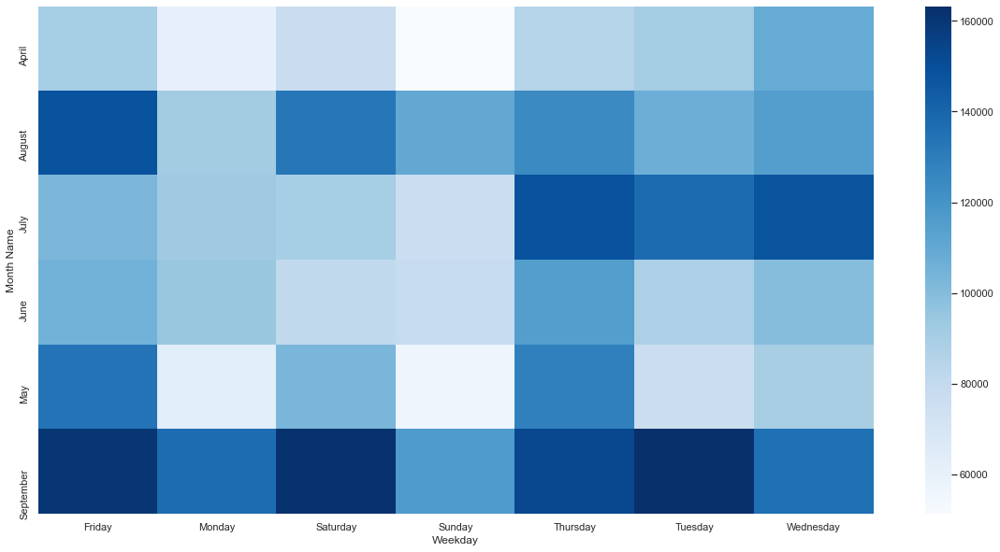

In [32]:
map_heatmap('Month Name', 'Weekday')
plt.show()

### Spatial Analysis using Heatmap

### Importing `Folium` Library 

In [33]:
from folium.plugins import HeatMap
import folium

In [34]:
def plot_spatialmap(df,day):
    basemap = folium.Map()
    uber_day_trips=df[df['Weekday']==day]
    HeatMap(uber_day_trips.groupby(['Lat', 'Lon'])['Weekday'].count().reset_index(),radius=15).add_to(basemap)
    return basemap

### Most Busiest day of the week is `Thursday`

In [35]:
plot_spatialmap(uber_df,'Thursday')

### Least Busiest day of the week is `Sunday`

In [36]:
plot_spatialmap(uber_df,'Sunday')

### Analysing Uber Pickup Dataset 

### Importing the Dataset

In [37]:
uber_15=pd.read_csv(r'D:\Pandas Data Analysis Project\Uber New York Trip Project\uber-pickups-in-new-york-city\uber-raw-data-janjune-15.csv')

In [38]:
uber_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


### Getting the Basic Information from the dataset

In [39]:
uber_15.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14270479 entries, 0 to 14270478
Data columns (total 4 columns):
 #   Column                Dtype 
---  ------                ----- 
 0   Dispatching_base_num  object
 1   Pickup_date           object
 2   Affiliated_base_num   object
 3   locationID            int64 
dtypes: int64(1), object(3)
memory usage: 435.5+ MB


### Coverting `Pickup Date` column into DateTime type

In [40]:
uber_15['Pickup_date'] = pd.to_datetime(uber_15['Pickup_date'], format='%Y/%m/%d %H:%M:%S')

In [41]:
uber_15.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14270479 entries, 0 to 14270478
Data columns (total 4 columns):
 #   Column                Dtype         
---  ------                -----         
 0   Dispatching_base_num  object        
 1   Pickup_date           datetime64[ns]
 2   Affiliated_base_num   object        
 3   locationID            int64         
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 435.5+ MB


### Creating `Month`, `Weekday`, `Day`, `Hour` and `Minute` Columns

In [42]:
uber_15['Month'] = uber_15['Pickup_date'].dt.month
uber_15['Month Name'] = uber_15['Pickup_date'].dt.month_name(locale = 'English')
uber_15['Weekday'] = uber_15['Pickup_date'].dt.day_name()
uber_15['Day'] = uber_15['Pickup_date'].dt.day
uber_15['Hour'] = uber_15['Pickup_date'].dt.hour
uber_15['Minute'] = uber_15['Pickup_date'].dt.minute

In [43]:
uber_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,Month,Month Name,Weekday,Day,Hour,Minute
0,B02617,2015-05-17 09:47:00,B02617,141,5,May,Sunday,17,9,47
1,B02617,2015-05-17 09:47:00,B02617,65,5,May,Sunday,17,9,47
2,B02617,2015-05-17 09:47:00,B02617,100,5,May,Sunday,17,9,47
3,B02617,2015-05-17 09:47:00,B02774,80,5,May,Sunday,17,9,47
4,B02617,2015-05-17 09:47:00,B02617,90,5,May,Sunday,17,9,47


### Sorting the dataset by `Pickup Date` Column

In [44]:
uber_15.sort_values(by='Pickup_date', inplace=True)

### Analysing Uber Pickups Each Month

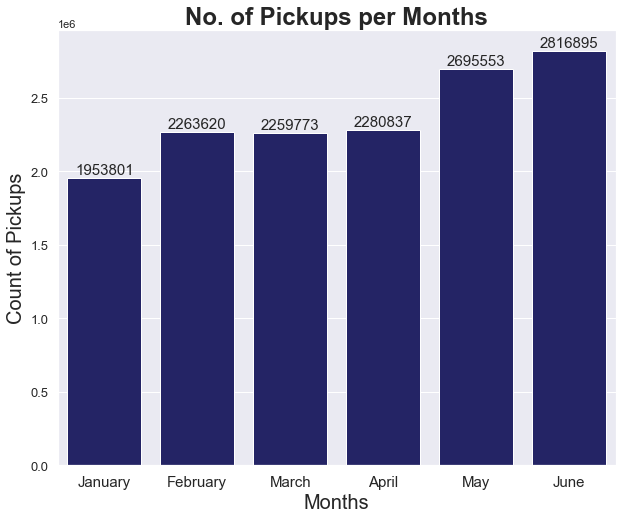

In [45]:
plt.figure(figsize=(10,8))

plots=sns.countplot(x=uber_15['Month Name'], color='midnightblue')

for bar in plots.patches:
        plots.annotate(format(bar.get_height()), 
                   (bar.get_x() + bar.get_width() / 2, 
                    bar.get_height()), ha='center', va='center',
                   size=15, xytext=(0, 8),
                   textcoords='offset points')
        
plt.xlabel('Months', fontsize = 20)
plt.xticks(fontsize=15)
plt.ylabel('Count of Pickups', fontsize = 20)
plt.yticks(fontsize=13)
plt.title('No. of Pickups per Months', fontsize = 24, fontweight = 'bold')

plt.show()

### Analysing Uber Pickups Each Hour

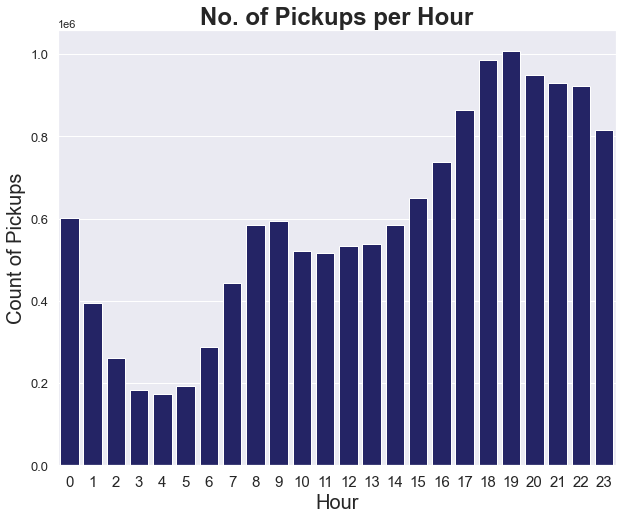

In [46]:
plt.figure(figsize=(10,8))

plots=sns.countplot(x=uber_15['Hour'], color='midnightblue')
        
plt.xlabel('Hour', fontsize = 20)
plt.xticks(fontsize=15)
plt.ylabel('Count of Pickups', fontsize = 20)
plt.yticks(fontsize=13)
plt.title('No. of Pickups per Hour', fontsize = 24, fontweight = 'bold')

plt.show()

### Analysing Uber Pickups Each `Hour` for `Weekdays`

In [47]:
weekday_df = uber_15.groupby(['Weekday', 'Hour'])['Pickup_date'].count().reset_index()
weekday_df

,Weekday,Hour,Pickup_date
0,Friday,0,85939
1,Friday,1,46616
2,Friday,2,28102
3,Friday,3,19518
4,Friday,4,23575
...,...,...,...
163,Wednesday,19,143751
164,Wednesday,20,136003
165,Wednesday,21,133993
166,Wednesday,22,127026


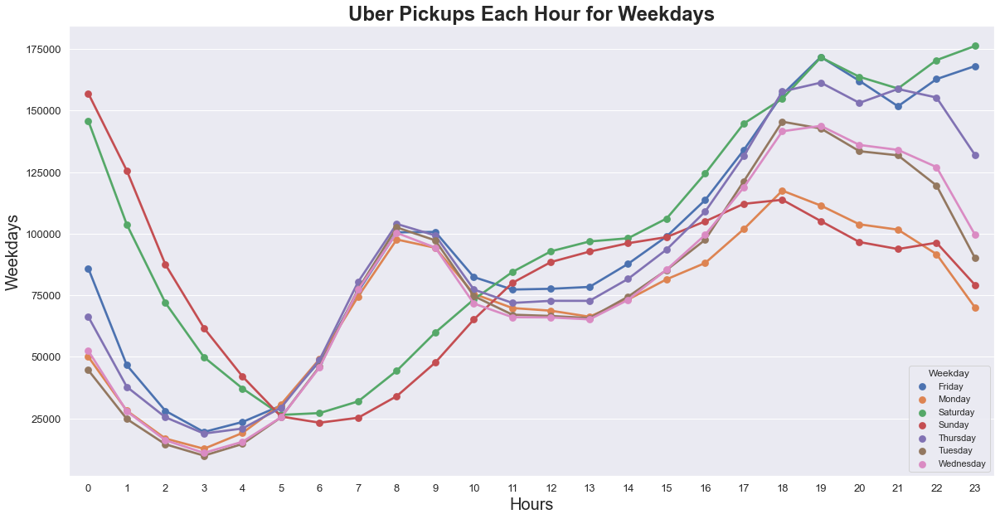

In [48]:
plt.figure(figsize=(20,10))

sns.pointplot(x=weekday_df['Hour'], y=weekday_df['Pickup_date'], hue=weekday_df['Weekday'])
       
plt.xlabel('Hours', fontsize = 20)
plt.xticks(fontsize=13)
plt.ylabel('Weekdays', fontsize = 20)
plt.yticks(fontsize=13)
plt.title('Uber Pickups Each Hour for Weekdays', fontsize = 24, fontweight = 'bold')

plt.show()

### Analysing Base Number Dataset

### Importing Dataset

In [49]:
base_df=pd.read_csv(r'D:\Pandas Data Analysis Project\Uber New York Trip Project\uber-pickups-in-new-york-city\Uber-Jan-Feb-FOIL.csv')

In [50]:
base_df.head()

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537


### Getting the Basic Information from the dataset

In [51]:
base_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 354 entries, 0 to 353
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   dispatching_base_number  354 non-null    object
 1   date                     354 non-null    object
 2   active_vehicles          354 non-null    int64 
 3   trips                    354 non-null    int64 
dtypes: int64(2), object(2)
memory usage: 11.2+ KB


### Coverting `Date` column into DateTime type

In [52]:
base_df['date'] = pd.to_datetime(base_df['date'], format='%m/%d/%Y')

In [53]:
base_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 354 entries, 0 to 353
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   dispatching_base_number  354 non-null    object        
 1   date                     354 non-null    datetime64[ns]
 2   active_vehicles          354 non-null    int64         
 3   trips                    354 non-null    int64         
dtypes: datetime64[ns](1), int64(2), object(1)
memory usage: 11.2+ KB


### Which `Base Number` has most Active Vehicle

In [54]:
base_df['dispatching_base_number'].unique()

array(['B02512', 'B02765', 'B02764', 'B02682', 'B02617', 'B02598'],
      dtype=object)

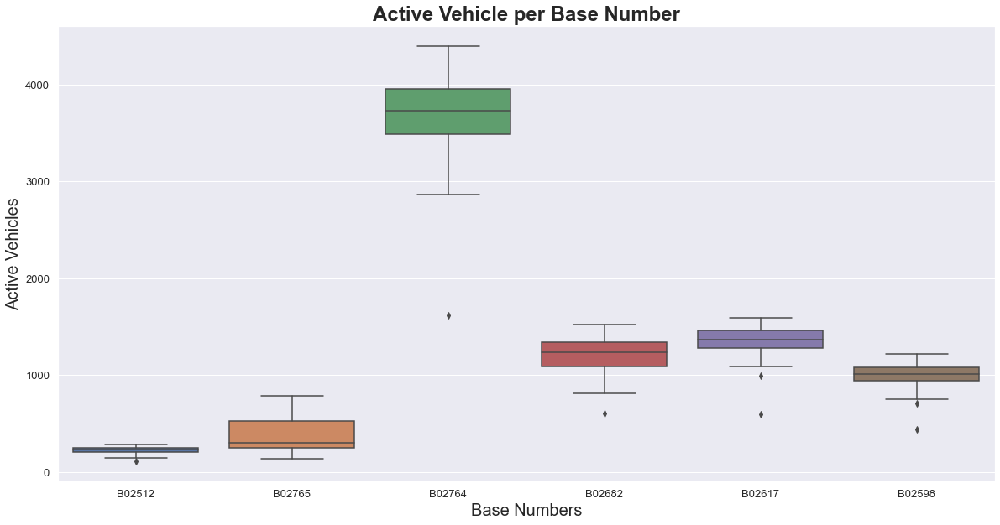

In [55]:
plt.figure(figsize=(20,10))

sns.boxplot(x=base_df['dispatching_base_number'], y=base_df['active_vehicles'])

plt.xlabel('Base Numbers', fontsize = 20)
plt.xticks(fontsize=13)
plt.ylabel('Active Vehicles', fontsize = 20)
plt.yticks(fontsize=13)
plt.title('Active Vehicle per Base Number', fontsize = 24, fontweight = 'bold')



plt.show()

### Which `Base Number` has maximum trips

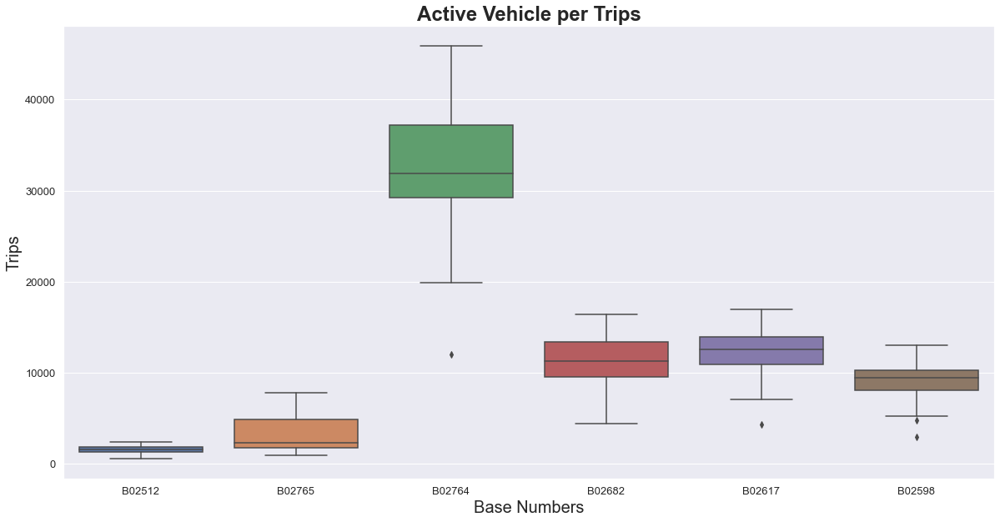

In [56]:
plt.figure(figsize=(20,10))

sns.boxplot(x=base_df['dispatching_base_number'], y=base_df['trips'])

plt.xlabel('Base Numbers', fontsize = 20)
plt.xticks(fontsize=13)
plt.ylabel('Trips', fontsize = 20)
plt.yticks(fontsize=13)
plt.title('Active Vehicle per Trips', fontsize = 24, fontweight = 'bold')



plt.show()

### Creating `Avg Trips/Vehicle` Column

In [57]:
base_df['avg_trips/vehicle'] = base_df['trips']/base_df['active_vehicles']

In [58]:
base_df.head()

,dispatching_base_number,date,active_vehicles,trips,avg_trips/vehicle
0,B02512,2015-01-01,190,1132,5.957895
1,B02765,2015-01-01,225,1765,7.844444
2,B02764,2015-01-01,3427,29421,8.585060
3,B02682,2015-01-01,945,7679,8.125926
4,B02617,2015-01-01,1228,9537,7.766287


### Making `Date` Column as Index

In [59]:
base_df.set_index('date')

,dispatching_base_number,active_vehicles,trips,avg_trips/vehicle
date,,,,
2015-01-01,B02512,190,1132,5.957895
2015-01-01,B02765,225,1765,7.844444
2015-01-01,B02764,3427,29421,8.585060
2015-01-01,B02682,945,7679,8.125926
2015-01-01,B02617,1228,9537,7.766287
...,...,...,...,...
2015-02-28,B02764,3952,39812,10.073887
2015-02-28,B02617,1372,14022,10.220117
2015-02-28,B02682,1386,14472,10.441558


### Analysis of `Avg Trips/Vehicle` with each `Base Number`

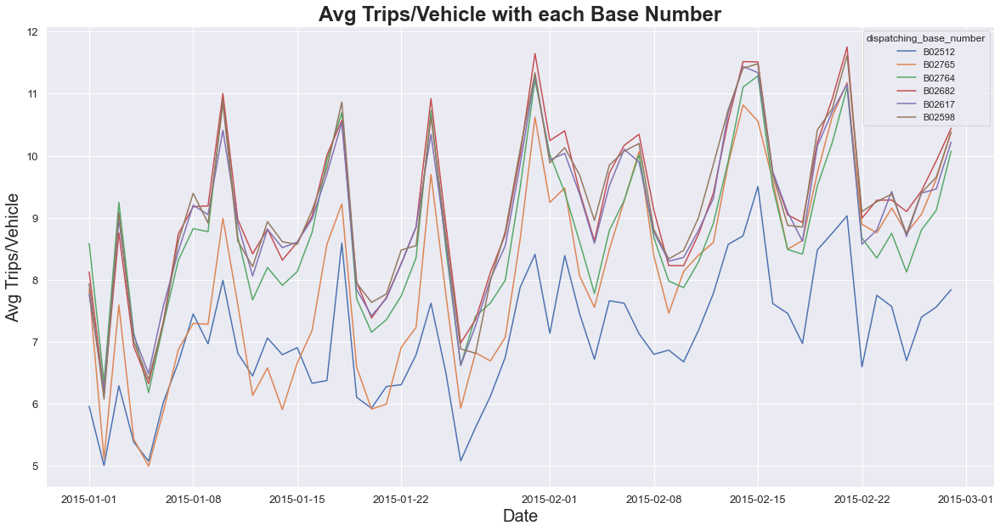

In [60]:
plt.figure(figsize=(20,10))

sns.lineplot(x=base_df['date'], y=base_df['avg_trips/vehicle'], hue=base_df['dispatching_base_number'])
       
plt.xlabel('Date', fontsize = 20)
plt.xticks(fontsize=13)
plt.ylabel('Avg Trips/Vehicle', fontsize = 20)
plt.yticks(fontsize=13)
plt.title('Avg Trips/Vehicle with each Base Number', fontsize = 24, fontweight = 'bold')

plt.show()